In [2]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib.widgets import SpanSelector
from sklearn.model_selection import train_test_split
import plotly.express as px
from sklearn.metrics import mean_squared_error
from math import sqrt
import statsmodels.api as sm
from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD
from sklearn import random_projection
from sklearn.feature_selection import RFE
from sklearn.linear_model import Lasso

# Reading the data 

In [3]:
original_data = pd.read_csv("energydata_complete.csv",encoding = 'unicode_escape')
original_data

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,...,17.033333,45.5300,6.600000,733.5,92.000000,7.000000,63.000000,5.300000,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,...,17.066667,45.5600,6.483333,733.6,92.000000,6.666667,59.166667,5.200000,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,...,17.000000,45.5000,6.366667,733.7,92.000000,6.333333,55.333333,5.100000,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,...,17.000000,45.4000,6.250000,733.8,92.000000,6.000000,51.500000,5.000000,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,...,17.000000,45.4000,6.133333,733.9,92.000000,5.666667,47.666667,4.900000,10.084097,10.084097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.700000,...,23.200000,46.7900,22.733333,755.2,55.666667,3.333333,23.666667,13.333333,43.096812,43.096812
19731,2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.700000,...,23.200000,46.7900,22.600000,755.2,56.000000,3.500000,24.500000,13.300000,49.282940,49.282940
19732,2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.700000,...,23.200000,46.7900,22.466667,755.2,56.333333,3.666667,25.333333,13.266667,29.199117,29.199117
19733,2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,...,23.200000,46.8175,22.333333,755.2,56.666667,3.833333,26.166667,13.233333,6.322784,6.322784


# Nature of data

In [4]:
#checking the nature of the assignment to have an idea of the number 
#of null values in them. Confirming there are non-null values
original_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

Question 1

Data Exploration and Visualisation

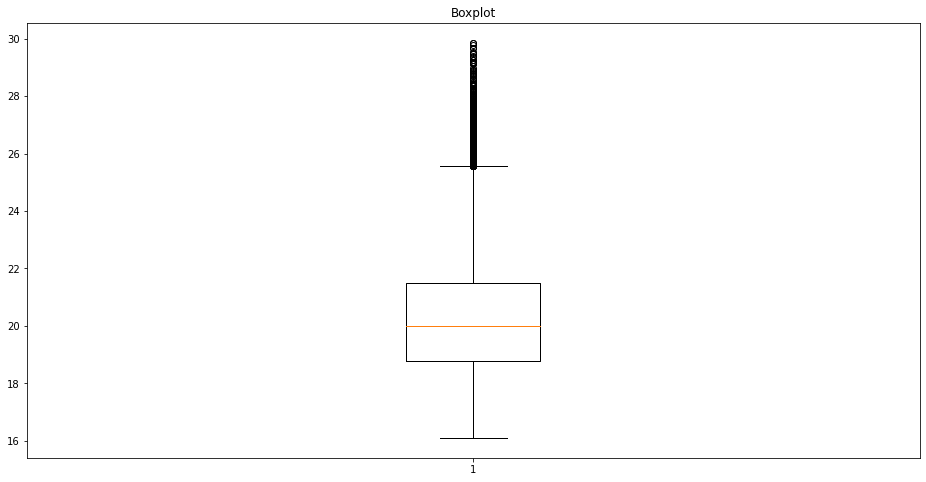

In [5]:
#boxplot to check for outliers in the data
fig, ax = plt.subplots(figsize=(16,8))
ax.set_title('Boxplot')
ax.boxplot(original_data['T2'])
plt.show()

#labeling the boxplot
# fig, ax = plt.subplots(figsize=(16,8))
# ax.set_title('Boxplot')
# ax.boxplot(original_data['T2'])
# ax.set_xticklabels(['T2'])
# plt.show()


<AxesSubplot:>

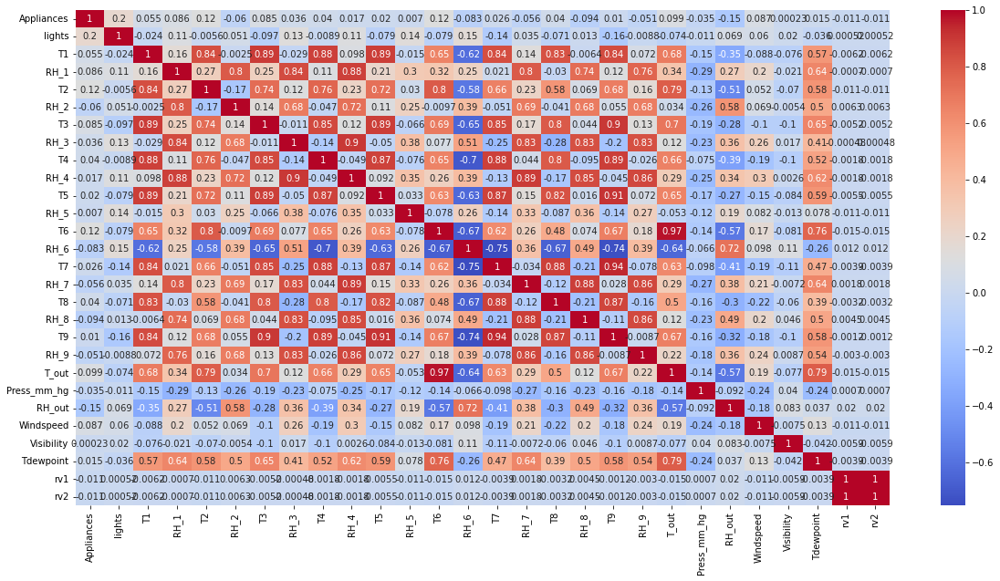

In [6]:
# Create a heatmap to see the correlation between the variables
plt.figure(figsize=(20,10))
sb.heatmap(original_data.corr(), annot=True, cmap='coolwarm')
 

Heavyapp data comprises of rooms in the house with big appliances

(array([0.5, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5]),
 [Text(0, 0.5, 'T1'),
  Text(0, 1.5, 'RH_1'),
  Text(0, 2.5, 'T2'),
  Text(0, 3.5, 'RH_2'),
  Text(0, 4.5, 'T3'),
  Text(0, 5.5, 'RH_3'),
  Text(0, 6.5, 'T4'),
  Text(0, 7.5, 'RH_4'),
  Text(0, 8.5, 'Appliances')])

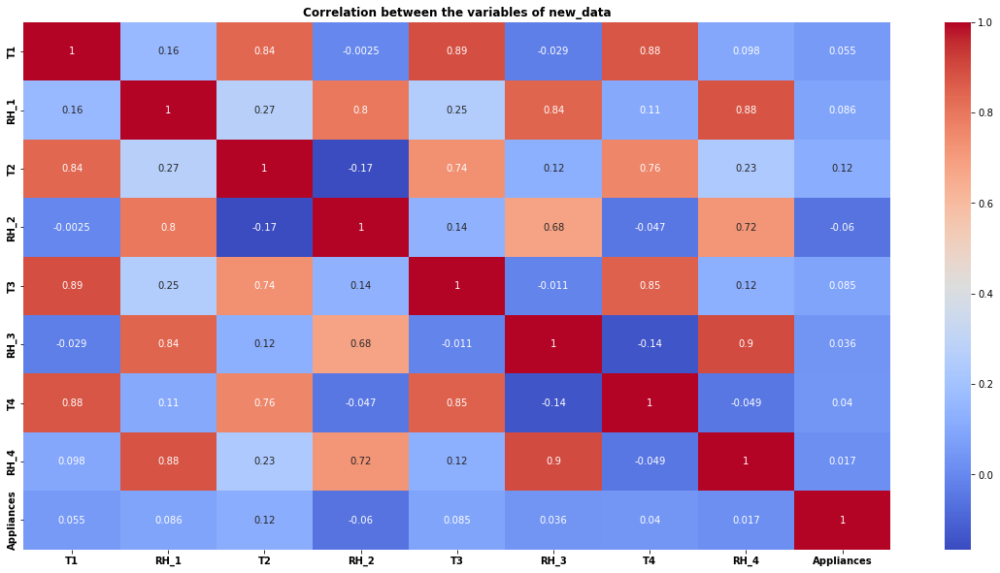

In [7]:
#create a new dataframe with the variables T1, RH_1, T2, RH_2, T3, RH_3, T4, RH_4
new_data_heavyapp = original_data[['T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4','Appliances']]

#create a heatmap to see the correlation between the variables of new_data
plt.figure(figsize=(20,10))
sb.heatmap(new_data_heavyapp.corr(), annot=True, cmap='coolwarm')

#bolden the title
plt.title('Correlation between the variables of new_data', fontweight="bold")
#bolden the variable names
plt.xticks(fontweight='bold')
plt.yticks(fontweight='bold')



Text(0.5, 0.98, 'Relationship between the variables of new_data_heavyapp')

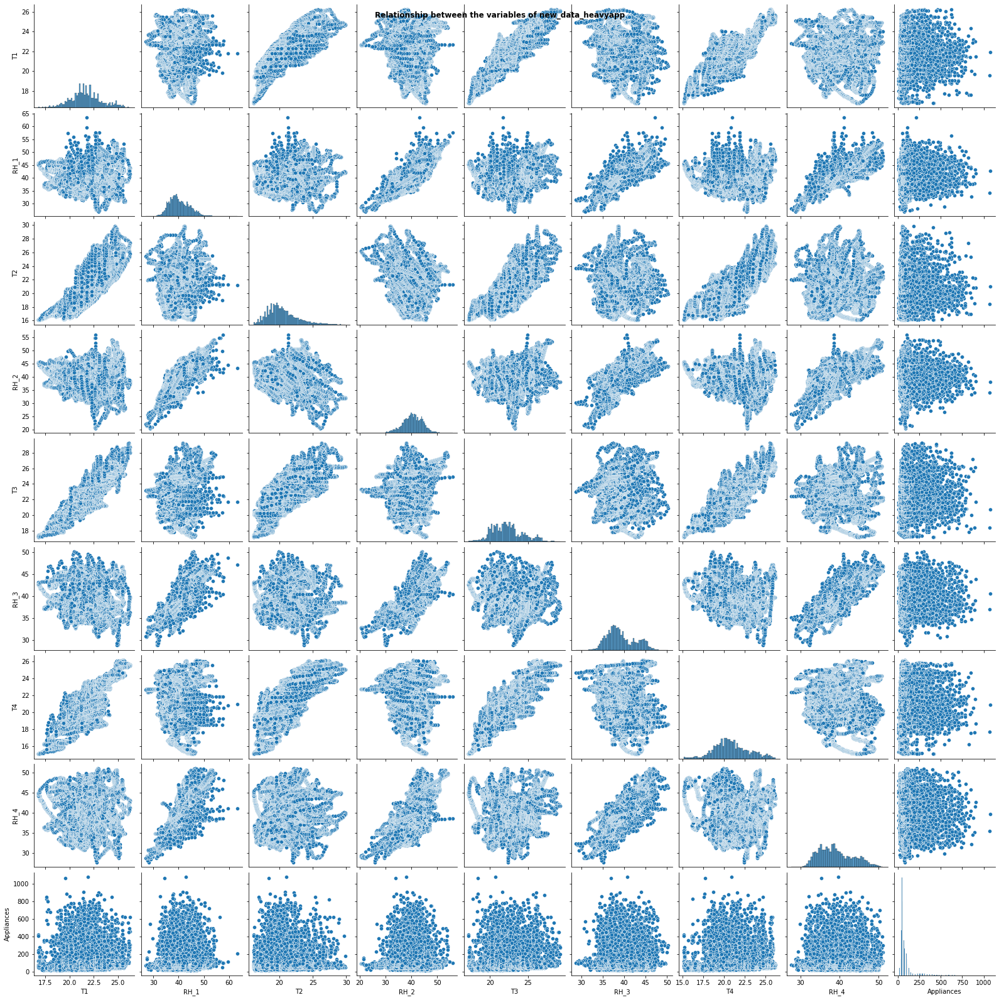

In [8]:
#create a pairplot to see the relationship between the variables of new_data_heavyapp
sb.pairplot(new_data_heavyapp)

#write a title for the pairplot and bolden it
plt.suptitle('Relationship between the variables of new_data_heavyapp', fontweight="bold")


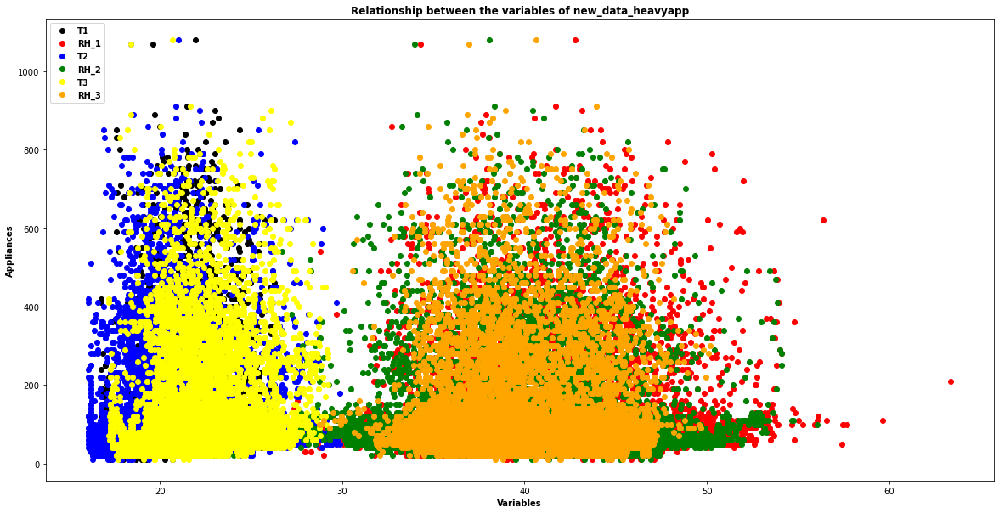

In [9]:
#make a plot of the variables T1, RH_1, T2, RH_2, T3, RH_3, T4, RH_4 as x and Appliances as y
plt.figure(figsize=(20,10))
plt.plot(new_data_heavyapp['T1'], new_data_heavyapp['Appliances'], 'o', color='black');
plt.plot(new_data_heavyapp['RH_1'], new_data_heavyapp['Appliances'], 'o', color='red');
plt.plot(new_data_heavyapp['T2'], new_data_heavyapp['Appliances'], 'o', color='blue');
plt.plot(new_data_heavyapp['RH_2'], new_data_heavyapp['Appliances'], 'o', color='green');
plt.plot(new_data_heavyapp['T3'], new_data_heavyapp['Appliances'], 'o', color='yellow');
plt.plot(new_data_heavyapp['RH_3'], new_data_heavyapp['Appliances'], 'o', color='orange');

#write a title for the plot and bolden it
plt.title('Relationship between the variables of new_data_heavyapp', fontweight="bold")

#label the x and y axis and bolden them
plt.xlabel('Variables', fontweight="bold")
plt.ylabel('Appliances', fontweight="bold")

#label the colours and bolden them
plt.legend(['T1', 'RH_1', 'T2', 'RH_2', 'T3', 'RH_3', 'T4', 'RH_4'], loc='upper left', prop={'weight':'bold'})




Lightapp: comprises of room with few appliances 

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5]),
 [Text(0, 0.5, 'T5'),
  Text(0, 1.5, 'RH_5'),
  Text(0, 2.5, 'T6'),
  Text(0, 3.5, 'RH_6'),
  Text(0, 4.5, 'T7'),
  Text(0, 5.5, 'RH_7'),
  Text(0, 6.5, 'T8'),
  Text(0, 7.5, 'RH_8'),
  Text(0, 8.5, 'T9'),
  Text(0, 9.5, 'RH_9'),
  Text(0, 10.5, 'Appliances')])

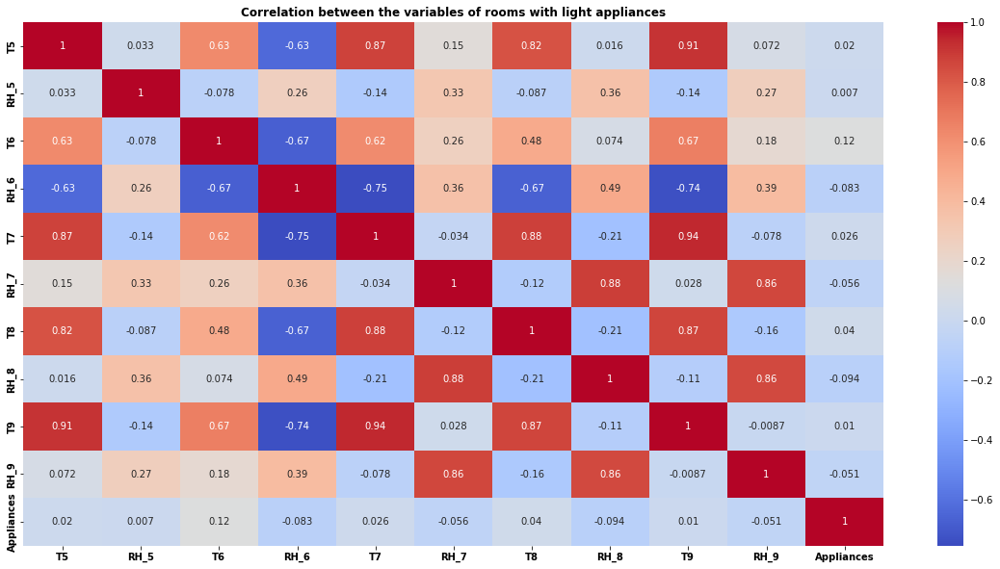

In [10]:
 # create a new dataframe with the variables T5, RH_5, T6, RH_6, T7, RH_7, T8, RH_8, T9, RH_9
new_data_lightapp = original_data[['T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8', 'RH_8', 'T9', 'RH_9','Appliances']]

#create a heatmap to see the correlation between the variables of new_data_lightapp
plt.figure(figsize=(20,10))
sb.heatmap(new_data_lightapp.corr(), annot=True, cmap='coolwarm')

#give the heatmap a title
# plt.title('Correlation between the variables of new_data_lightapp')

#bolden the title
plt.title('Correlation between the variables of rooms with light appliances', fontweight="bold")

#bolden the title
# plt.title('Correlation between the variables of new_data', fontweight="bold")
#bolden the variable names
plt.xticks(fontweight='bold')
plt.yticks(fontweight='bold')


Text(0.5, 0.98, 'Relationship between the variables of new_data_lightapp')

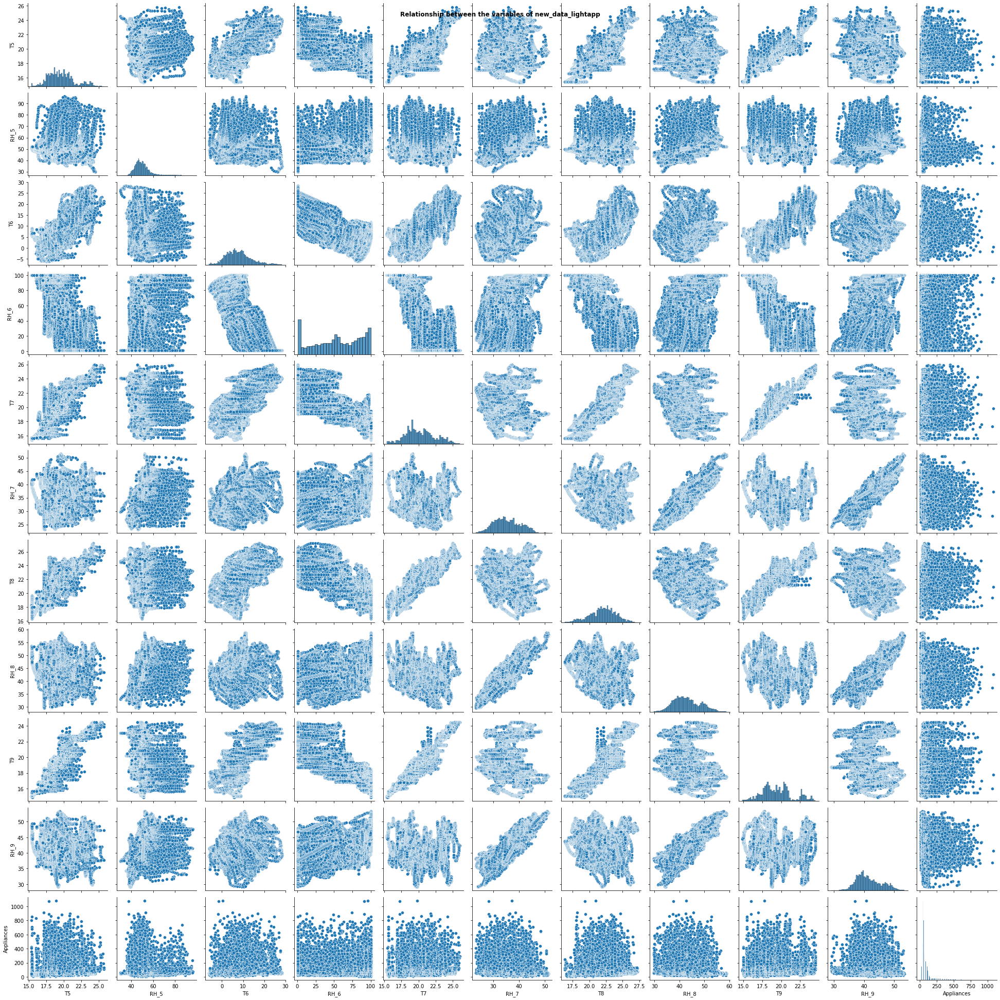

In [11]:
#create a pairplot to see the relationship between the variables of new_data_lightapp
sb.pairplot(new_data_lightapp)

#write a title for the pairplot and bolden it
plt.suptitle('Relationship between the variables of new_data_lightapp', fontweight="bold")

Comprises of humidity and temperature data from outside 

Text(0.5, 1.0, 'Correlation between the variables of new_data_outside')

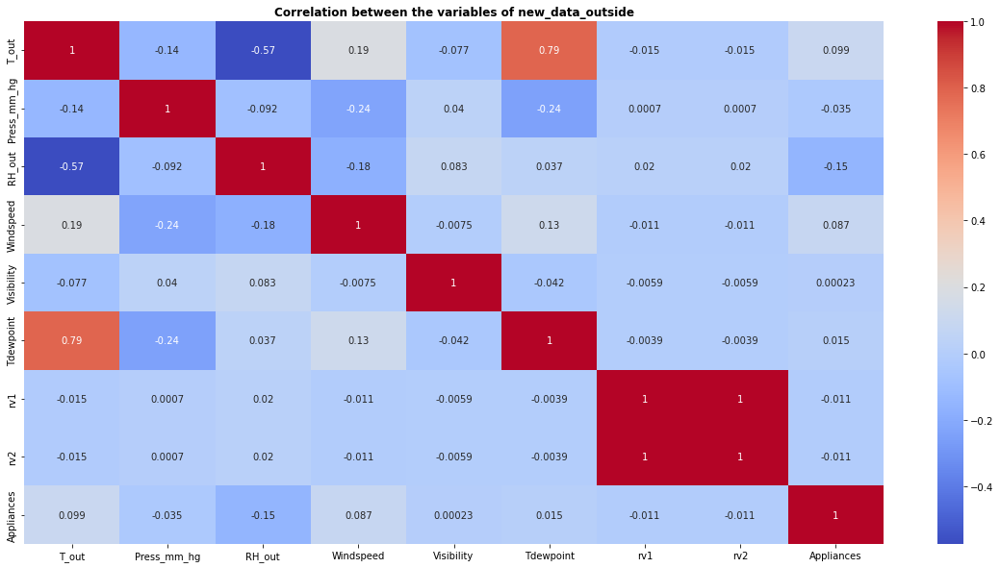

In [12]:
# create a new dataframe with the variables T_out, Press_mm_hg, RH_out, Windspeed, Visibility, Tdewpoint, rv1, rv2, and Appliances
new_data_outside = original_data[['T_out', 'Press_mm_hg', 'RH_out', 'Windspeed', 'Visibility', 'Tdewpoint', 'rv1', 'rv2', 'Appliances']]

#create a heatmap to see the correlation between the variables of new_data_outside
plt.figure(figsize=(20,10))
sb.heatmap(new_data_outside.corr(), annot=True, cmap='coolwarm')

#give the heatmap a title and bolden it
plt.title('Correlation between the variables of new_data_outside', fontweight="bold")


Text(0.5, 0.98, 'Relationship between the variables of original_data')

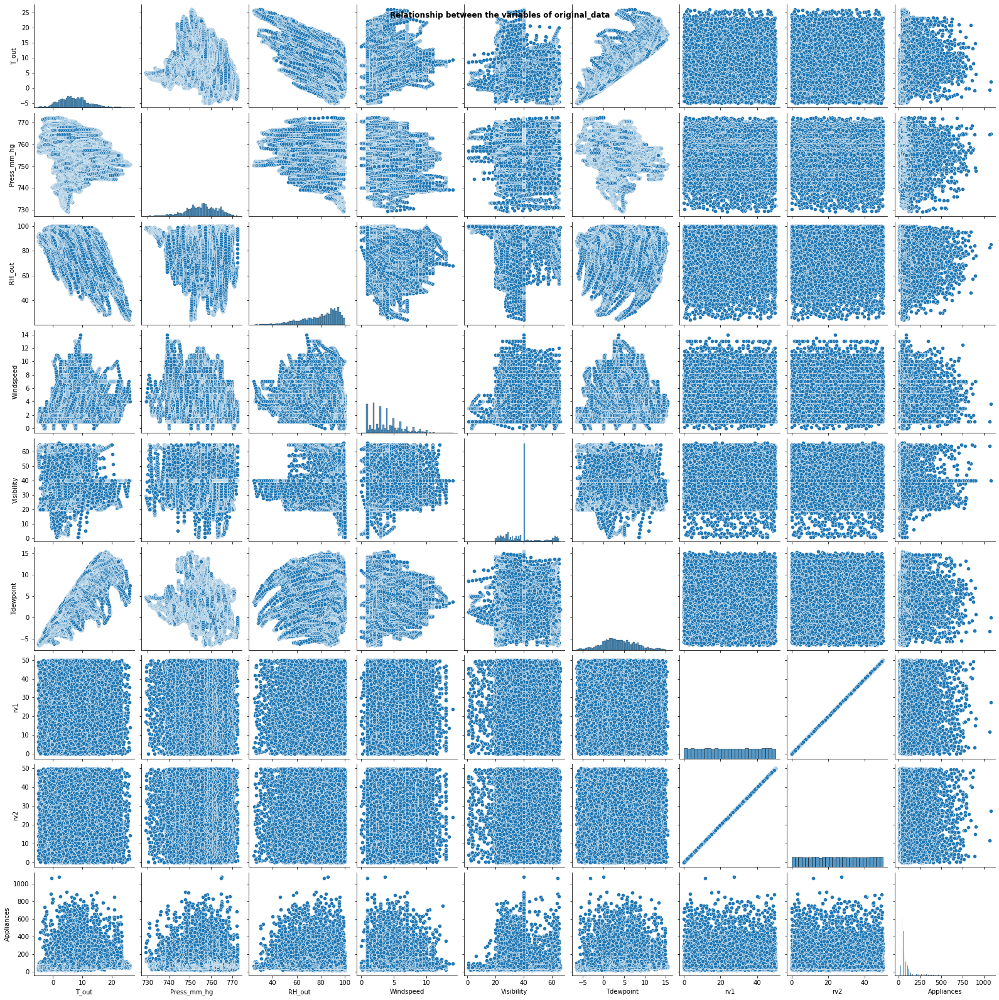

In [13]:
# Create a pairplot of the variables of new_data_outside
sb.pairplot(new_data_outside)

#give it a title and bolden it
plt.suptitle('Relationship between the variables of original_data', fontweight="bold")


Time Series / Interactive plots 

In [14]:
#create an  plot of the date and time and the appliances(not interactive)
fig = px.line(original_data, x='date', y='Appliances')
fig.show()

#give the plot a title and bolden it
fig.update_layout(title='Appliances over time', title_x=0.5)



Interactive plot of Energy Consumption over Time 

In [15]:
# Create a line chart with Plotly
fig = px.line(original_data, x='date', y='Appliances')

# Add range slider and range selector for user interaction
fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=7, label='1w', step='day', stepmode='backward'),
                dict(count=14, label='2w', step='day', stepmode='backward'),
                dict(count=30, label='1m', step='day', stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(visible=True),
        type='date'
    )
)
#give fig a title and bolden it
fig.update_layout(
    title='Interactive time series plot of the date and time and the Energy Consumption')

# Show the plot
fig.show()




Question 2

In [16]:
#split the data into training and testing sets using 70% of the data for training and 30% for testing
X = original_data.drop('Appliances', axis=1)
#drop the date and time columns
X = X.drop(['date', 'lights'], axis=1)
y = original_data['Appliances']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

First Linear Regression with all predictor variables

Coefficients: 
 [-3.70720673e-01  1.63001980e+01 -1.83700295e+01 -1.37407481e+01
  2.58367429e+01  4.80316182e+00  2.79366382e+00  1.20498426e+00
 -1.60084298e+00  2.57510931e-01  7.36354686e+00  4.11648713e-01
  1.04063061e+00 -1.69278695e+00  9.99097025e+00 -5.77886090e+00
 -2.11484524e+01 -1.76267959e+00 -1.10736285e+01  1.70187889e-01
 -1.09352104e+00  2.23042487e+00  2.02585717e-01  5.70139259e+00
  1.64829984e-02  1.64829984e-02]
Mean squared error: %.2f
8768.535925051974
Coefficient of determination: %.2f
0.14890246319303535
93.64046093998029


Text(0.5, 1.0, 'Predicted values against the actual values')

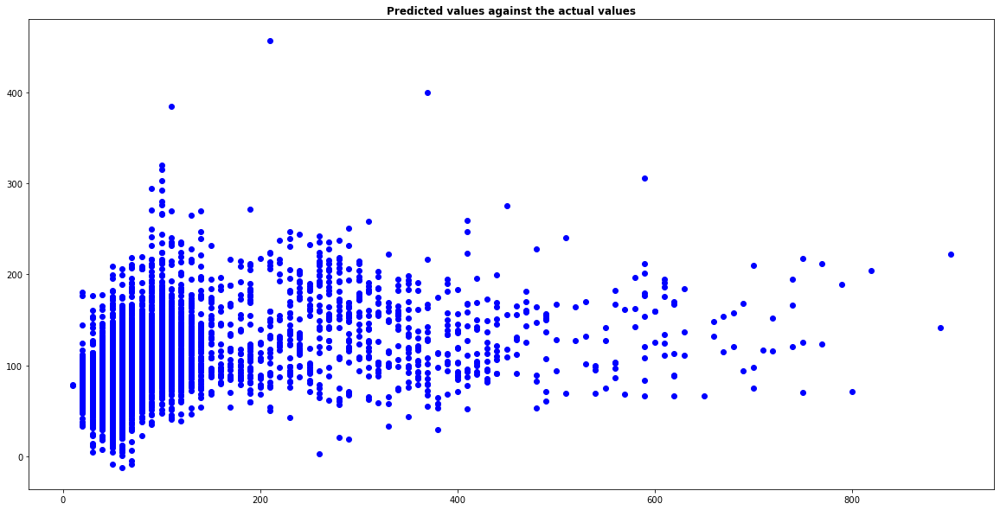

In [17]:
#build a linear regression model to predict the appliances with the training data
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Create a linear regression object
reg = LinearRegression()

# Train the model using the training sets
reg.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = reg.predict(X_test)

# The coefficients
print('Coefficients: \n', reg.coef_)

# The mean squared error
print('Mean squared error: %.2f')
print(mean_squared_error(y_test, y_pred))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f')
print(r2_score(y_test, y_pred))

#calculate the root mean squared error
rms = sqrt(mean_squared_error(y_test, y_pred))
print(rms)

#plot the predicted values against the actual values
plt.figure(figsize=(20,10))
plt.plot(y_test, y_pred, 'o', color='blue')

#write a title for the plot and bolden it
plt.title('Predicted values against the actual values', fontweight="bold")


Linear Regression using OLS (Ordinary Least Squares)

In [18]:
#perform linear regression using the statsmodels library

# Add a constant to get an intercept
X_train_sm = sm.add_constant(X_train)

# Create a first fitted model
lr = sm.OLS(y_train, X_train_sm).fit()

# Print out the statistics
print(lr.summary())



                            OLS Regression Results                            
Dep. Variable:             Appliances   R-squared:                       0.145
Model:                            OLS   Adj. R-squared:                  0.143
Method:                 Least Squares   F-statistic:                     93.32
Date:                Fri, 07 Apr 2023   Prob (F-statistic):               0.00
Time:                        18:14:49   Log-Likelihood:                -82540.
No. Observations:               13814   AIC:                         1.651e+05
Df Residuals:                   13788   BIC:                         1.653e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           1.2072    115.652      0.010      

Drop features with p > 0.05

In [19]:
#drop the variables with p-values greater than 0.05
X_train_sm = X_train_sm.drop(['RH_2', 'T9', 'RH_8', 'T6', 'RH_out', 'T_out', 'Press_mm_hg', 'RH_7', 'RH_9', 'rv1', 'rv2'], axis=1)

# Create a second fitted model
lr = sm.OLS(y_train, X_train_sm).fit()

# Print out the statistics
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:             Appliances   R-squared:                       0.084
Model:                            OLS   Adj. R-squared:                  0.083
Method:                 Least Squares   F-statistic:                     84.64
Date:                Fri, 07 Apr 2023   Prob (F-statistic):          9.40e-250
Time:                        18:14:49   Log-Likelihood:                -83012.
No. Observations:               13814   AIC:                         1.661e+05
Df Residuals:                   13798   BIC:                         1.662e+05
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -118.4769     23.823     -4.973      0.0

In [20]:
#drop RH_3 
X_train_sm = X_train_sm.drop(['RH_3'], axis=1)

# Create a second fitted model
lr = sm.OLS(y_train, X_train_sm).fit()

# Print out the statistics
print(lr.summary())




                            OLS Regression Results                            
Dep. Variable:             Appliances   R-squared:                       0.084
Model:                            OLS   Adj. R-squared:                  0.083
Method:                 Least Squares   F-statistic:                     90.49
Date:                Fri, 07 Apr 2023   Prob (F-statistic):          3.37e-250
Time:                        18:14:49   Log-Likelihood:                -83013.
No. Observations:               13814   AIC:                         1.661e+05
Df Residuals:                   13799   BIC:                         1.662e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -125.8738     23.364     -5.387      0.0

In [21]:
#find the mean squared error of lr
y_pred = reg.predict(X_test)

# The mean squared error
print('Mean squared error: %.2f')
print(mean_squared_error(y_test, y_pred))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f')
print(r2_score(y_test, y_pred))

#calculate the root mean squared error
rms = sqrt(mean_squared_error(y_test, y_pred))
print('RMSE: ',rms)

Mean squared error: %.2f
8768.535925051974
Coefficient of determination: %.2f
0.14890246319303535
RMSE:  93.64046093998029


In [22]:
#calculate the root mean squared error of lr

rms = sqrt(mean_squared_error(y_test, y_pred))
print(rms)

93.64046093998029


Dimensionality Reduction 

First using PCA 

Mean squared error: %.2f
8768.534091206517
Coefficient of determination: %.2f
0.14890264119097774
RMSE:  93.6404511480296


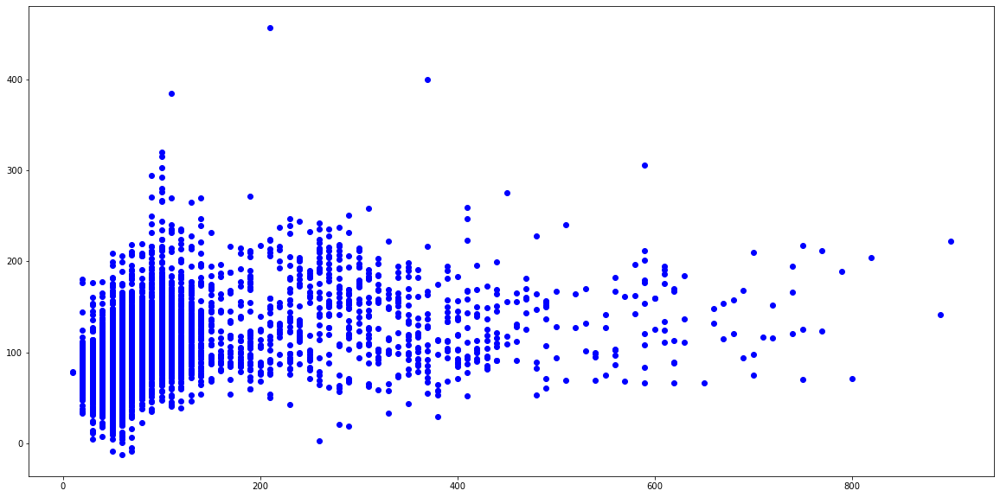

In [23]:
#perform dimensionality reduction using PCA

# Create a PCA object
pca = PCA()

# Fit and transform the data to the model
pca.fit(X_train)

# Transform the data
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

# Create a linear regression object
reg = LinearRegression()

# Train the model using the training sets
reg.fit(X_train_pca, y_train)

# Make predictions using the testing set
y_pred = reg.predict(X_test_pca)

# The mean squared error
print('Mean squared error: %.2f')
print(mean_squared_error(y_test, y_pred))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f')
print(r2_score(y_test, y_pred))

#plot the predicted values against the actual values with different colors
plt.figure(figsize=(20,10))
plt.plot(y_test, y_pred, 'o', color='blue')


#calculate the root mean squared error of pca
rms = sqrt(mean_squared_error(y_test, y_pred))
print('RMSE: ',rms)



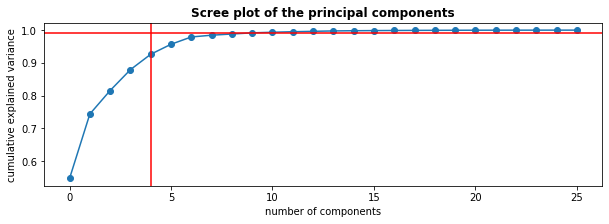

In [24]:
#find the variance explained by each of the principal components
pca.explained_variance_ratio_

# find the cumulative sum of the variance explained by the principal components
np.cumsum(pca.explained_variance_ratio_)
# the first 4 principal components explain 99% of the variance in the data

#make a scree plot of the principal components
plt.figure(figsize=(10,3))
plt.plot(np.cumsum(pca.explained_variance_ratio_), 'o-')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('Scree plot of the principal components', fontweight="bold")

#mark the 99% variance explained by the first 4 principal components
plt.axhline(y=0.99, color='r', linestyle='-')
plt.axvline(x=4, color='r', linestyle='-')




Linear Regression using the first 4 components that comprises of the 99% variance 

In [25]:
#build a linear regression model using the first 4 principal components
# Create a linear regression object
reg = LinearRegression()

# Train the model using the training sets
reg.fit(X_train_pca[:,0:4], y_train)

# Make predictions using the testing set
y_pred = reg.predict(X_test_pca[:,0:4])

# The mean squared error
print('Mean squared error: %.2f')
print(mean_squared_error(y_test, y_pred))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f')
print(r2_score(y_test, y_pred))

#calculate the root mean squared error of pca
rms = sqrt(mean_squared_error(y_test, y_pred))
print('RMSE: ',rms)


Mean squared error: %.2f
10178.64485581348
Coefficient of determination: %.2f
0.012033520890845084
RMSE:  100.88927027099304


Second Dimensionality reduction: Singular Value Decomposition

In [26]:
#perform dimensionality reduction using singular value decomposition

# Create a TruncatedSVD object
svd = TruncatedSVD(n_components=10)

# Fit and transform the data to the model
svd.fit(X_train)

# Transform the data
X_train_svd = svd.transform(X_train)
X_test_svd = svd.transform(X_test)

# Create a linear regression object
reg = LinearRegression()

# Train the model using the training sets
reg.fit(X_train_svd, y_train)

# Make predictions using the testing set
y_pred = reg.predict(X_test_svd)

# The mean squared error
print('Mean squared error: %.2f')
print(mean_squared_error(y_test, y_pred))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f')
print(r2_score(y_test, y_pred))

#calculate the root mean squared error of svd
rms = sqrt(mean_squared_error(y_test, y_pred))
print('RMSE: ',rms)


Mean squared error: %.2f
9751.752847328044
Coefficient of determination: %.2f
0.05346880039588742
RMSE:  98.75096377923632


Third dimensionality reduction: Random Projection

In [27]:
#perform dimensionality reduction using random projection


# Create a random projection object
rp = random_projection.GaussianRandomProjection(n_components=10)

# Fit and transform the data to the model
rp.fit(X_train)

# Transform the data
X_train_rp = rp.transform(X_train)
X_test_rp = rp.transform(X_test)

# Create a linear regression object
reg = LinearRegression()

# Train the model using the training sets
reg.fit(X_train_rp, y_train)

# Make predictions using the testing set
y_pred = reg.predict(X_test_rp)

# The mean squared error
print('Mean squared error: %.2f')
print(mean_squared_error(y_test, y_pred))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f')
print(r2_score(y_test, y_pred))

#calculate the root mean squared error of rp
rms = sqrt(mean_squared_error(y_test, y_pred))
print('RMSE: ',rms)


Mean squared error: %.2f
9565.827410895414
Coefficient of determination: %.2f
0.07151522026918378
RMSE:  97.80504798268551


Feature Selection: Recursive feature elimination 

In [28]:
#perform feature selection using recursive feature elimination


# Create a linear regression object
reg = LinearRegression()

# Create the RFE object and rank each pixel
rfe = RFE(reg, n_features_to_select=10)
rfe.fit(X_train, y_train)

# Print the features and their ranking
print(rfe.ranking_)

#print the rankings of the features and their names
for i in range(len(rfe.ranking_)):
    if rfe.ranking_[i] == 1:
        print(i, X_train.columns[i])


[11  1  1  1  1  1  3  6  8 13  1 12  9  5  1  1  1  7  1 15 10  2 14  4
 17 16]
1 RH_1
2 T2
3 RH_2
4 T3
5 RH_3
10 T6
14 T8
15 RH_8
16 T9
18 T_out


Creating a new regression model after recursive feature selection

In [29]:
# Create a new dataset using only the selected features
X_train_rfe = rfe.transform(X_train) 


# Create a linear regression object
reg = LinearRegression()

# Train the model using the training sets
reg.fit(X_train_rfe, y_train)

# Make predictions using the testing set
y_pred = reg.predict(rfe.transform(X_test))

# The mean squared error
print('Mean squared error: %.2f')
print(mean_squared_error(y_test, y_pred))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f')
print(r2_score(y_test, y_pred))

#calculate the root mean squared error of rfe
rms = sqrt(mean_squared_error(y_test, y_pred))
print('RMSE: ',rms)

Mean squared error: %.2f
8807.675937985885
Coefficient of determination: %.2f
0.1451034289091624
RMSE:  93.84921916556304


Second Feature Selection: Backward Elimination

In [30]:
#perform feature selection using backward elimination


# Add a constant to the dataset
X_train_sm = sm.add_constant(X_train)

# Create a OLS object
model = sm.OLS(y_train, X_train_sm)

# Fit the data
results = model.fit()

# Print a summary of the results
print(results.summary())

#find the p-values of the features
results.pvalues

#find the features with p-values less than 0.05
for i in range(len(results.pvalues)):
    if results.pvalues[i] < 0.05:
        print(i, X_train.columns[i])


                            OLS Regression Results                            
Dep. Variable:             Appliances   R-squared:                       0.145
Model:                            OLS   Adj. R-squared:                  0.143
Method:                 Least Squares   F-statistic:                     93.32
Date:                Fri, 07 Apr 2023   Prob (F-statistic):               0.00
Time:                        18:14:50   Log-Likelihood:                -82540.
No. Observations:               13814   AIC:                         1.651e+05
Df Residuals:                   13788   BIC:                         1.653e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           1.2072    115.652      0.010      

Linear Regression on selected features

In [31]:
# Create a new dataset using only the selected features
X_train_sm = X_train_sm[["T2", "RH_2", "T3", "RH_3", "T4", "RH_4", "T6", "RH_6", "T7", "T8", "RH_8", "T9", "RH_9", "T_out", "Press_mm_hg", "Windspeed", "Visibility", "Tdewpoint", "rv1"]]

# Create a linear regression object
reg = LinearRegression()

# Train the model using the training sets
reg.fit(X_train_sm, y_train)

# Make predictions using the testing set
y_pred = reg.predict(sm.add_constant(X_test)[["T2", "RH_2", "T3", "RH_3", "T4", "RH_4", "T6", "RH_6", "T7", "T8", "RH_8", "T9", "RH_9", "T_out", "Press_mm_hg", "Windspeed", "Visibility", "Tdewpoint", "rv1"]])

# The mean squared error
print('Mean squared error: %.2f')
print(mean_squared_error(y_test, y_pred))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f')
print(r2_score(y_test, y_pred))

#calculate the root mean squared error of backward elimination
rms = sqrt(mean_squared_error(y_test, y_pred))
print('RMSE: ',rms)

Mean squared error: %.2f
9095.82437629741
Coefficient of determination: %.2f
0.1171349712124734
RMSE:  95.37203141538619


Third Feature Selection: L1 Regularization

In [32]:
#perform feature selection using l1 regularization  

# Create a linear regression object
reg = Lasso(alpha=0.1)

# Train the model using the training sets
reg.fit(X_train, y_train)

# Make predictions using the testing set
y_pred = reg.predict(X_test)

# The mean squared error
print('Mean squared error: %.2f')
print(mean_squared_error(y_test, y_pred))

# The coefficient of determination: 1 is perfect prediction
print('Coefficient of determination: %.2f')
print(r2_score(y_test, y_pred))

#calculate the root mean squared error of l1 regularization
rms = sqrt(mean_squared_error(y_test, y_pred))
print('RMSE: ',rms)

Mean squared error: %.2f
8769.771779225854
Coefficient of determination: %.2f
0.14878250788325142
RMSE:  93.64705964004344


In [33]:
#rank features using l1 regularization
for i in range(len(reg.coef_)):
    if reg.coef_[i] != 0:
        print(i, X_train.columns[i])

1 RH_1
2 T2
3 RH_2
4 T3
5 RH_3
6 T4
7 RH_4
8 T5
9 RH_5
10 T6
11 RH_6
12 T7
13 RH_7
14 T8
15 RH_8
16 T9
17 RH_9
18 T_out
19 Press_mm_hg
20 RH_out
21 Windspeed
22 Visibility
23 Tdewpoint
24 rv1
25 rv2
